# Predictive Modelling Using Social Profile in Online P2P Lending Market

# Business Objective

Online peer-to-peer (P2P) lending markets enable individual consumers to borrow from and lend money to, one another directly. We study the borrower-loan- and group-related determinants of performance predictability in an online P2P lending market by conceptualizing financial and social strength to predict ROI and Loan status.

# Importing Libraries

In [1]:
import numpy as np 
import pandas as pd 
import math
import numpy as np
import pandas as pd
from mlxtend.preprocessing import minmax_scaling
from scipy import stats as st
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import datetime
import time
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error,accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier 
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import recall_score, precision_score, f1_score, make_scorer
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score
from mlxtend.plotting import plot_confusion_matrix
from sklearn.metrics import  ConfusionMatrixDisplay
import warnings
warnings.filterwarnings('ignore')

# Importing Dataset

This data set contains 113,937 rows with 81 variables columns, including loan amount, borrower rate (or interest rate), current loan status, borrower income, and many others.

In [2]:
df = pd.read_csv("prosperLoanData.csv")
df

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,...,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,1021339766868145413AB3B,193129,2007-08-26 19:09:29.263000000,C,36,Completed,2009-08-14 00:00:00,0.16516,0.1580,0.1380,...,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,10273602499503308B223C1,1209647,2014-02-27 08:28:07.900000000,NaN,36,Current,NaN,0.12016,0.0920,0.0820,...,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,0EE9337825851032864889A,81716,2007-01-05 15:00:47.090000000,HR,36,Completed,2009-12-17 00:00:00,0.28269,0.2750,0.2400,...,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,0EF5356002482715299901A,658116,2012-10-22 11:02:35.010000000,NaN,36,Current,NaN,0.12528,0.0974,0.0874,...,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,0F023589499656230C5E3E2,909464,2013-09-14 18:38:39.097000000,NaN,36,Current,NaN,0.24614,0.2085,0.1985,...,-60.27,0.0,0.0,0.0,0.0,1.0,0,0,0.0,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113932,E6D9357655724827169606C,753087,2013-04-14 05:55:02.663000000,NaN,36,Current,NaN,0.22354,0.1864,0.1764,...,-75.58,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
113933,E6DB353036033497292EE43,537216,2011-11-03 20:42:55.333000000,NaN,36,FinalPaymentInProgress,NaN,0.13220,0.1110,0.1010,...,-30.05,0.0,0.0,0.0,0.0,1.0,0,0,0.0,22
113934,E6E13596170052029692BB1,1069178,2013-12-13 05:49:12.703000000,NaN,60,Current,NaN,0.23984,0.2150,0.2050,...,-16.91,0.0,0.0,0.0,0.0,1.0,0,0,0.0,119
113935,E6EB3531504622671970D9E,539056,2011-11-14 13:18:26.597000000,NaN,60,Completed,2013-08-13 00:00:00,0.28408,0.2605,0.2505,...,-235.05,0.0,0.0,0.0,0.0,1.0,0,0,0.0,274


In [3]:
#inspect missing values in the data sets
print(df.isnull().values.sum())

1364086


In [4]:
#checking for missing vlaues
df.isnull().sum()

ListingKey                         0
ListingNumber                      0
ListingCreationDate                0
CreditGrade                    84984
Term                               0
                               ...  
PercentFunded                      0
Recommendations                    0
InvestmentFromFriendsCount         0
InvestmentFromFriendsAmount        0
Investors                          0
Length: 81, dtype: int64

In [5]:
#Checking for wrong entries like symbols -,?,#,*,etc.
for col in df.columns:
    print('{} : {}'.format(col,df[col].unique()))

ListingKey : ['1021339766868145413AB3B' '10273602499503308B223C1'
 '0EE9337825851032864889A' ... 'E6E13596170052029692BB1'
 'E6EB3531504622671970D9E' 'E6ED3600409833199F711B7']
ListingNumber : [ 193129 1209647   81716 ... 1069178  539056 1140093]
ListingCreationDate : ['2007-08-26 19:09:29.263000000' '2014-02-27 08:28:07.900000000'
 '2007-01-05 15:00:47.090000000' ... '2013-12-13 05:49:12.703000000'
 '2011-11-14 13:18:26.597000000' '2014-01-15 09:27:37.657000000']
CreditGrade : ['C' nan 'HR' 'AA' 'D' 'B' 'E' 'A' 'NC']
Term : [36 60 12]
LoanStatus : ['Completed' 'Current' 'Past Due (1-15 days)' 'Defaulted' 'Chargedoff'
 'Past Due (16-30 days)' 'Cancelled' 'Past Due (61-90 days)'
 'Past Due (31-60 days)' 'Past Due (91-120 days)' 'FinalPaymentInProgress'
 'Past Due (>120 days)']
ClosedDate : ['2009-08-14 00:00:00' nan '2009-12-17 00:00:00' ... '2006-10-25 00:00:00'
 '2005-12-08 00:00:00' '2005-11-25 00:00:00']
BorrowerAPR : [0.16516 0.12016 0.28269 ... 0.22674 0.3477  0.19543]
BorrowerRat

IncomeRange : ['$25,000-49,999' '$50,000-74,999' 'Not displayed' '$100,000+'
 '$75,000-99,999' '$1-24,999' 'Not employed' '$0']
IncomeVerifiable : [ True False]
StatedMonthlyIncome : [ 3083.333333  6125.        2083.333333 ...  2608.25      1539.166667
 18756.      ]
LoanKey : ['E33A3400205839220442E84' '9E3B37071505919926B1D82'
 '6954337960046817851BCB2' ... 'DD1A370200396006300ACA0'
 '589536350469116027ED11B' '00AF3704550953269A64E40']
TotalProsperLoans : [nan  1.  3.  2.  4.  6.  5.  8.  7.  0.]
TotalProsperPaymentsBilled : [ nan  11.  67.  12.   8.   9.  20.   1.   4.  16.   6.  10.  32.  35.
  14.  29.   5.  22.  13.  24.   3.  25.  15.  46.   2.  30.  27.  18.
  28.  26.  34.  74.  36.  54.  63.   7.  50.  33.  21.  19.  38.  42.
  39.  65.  23.  95.  56.  53.  66.  51.  76.  17.  48.  78. 107.  77.
 131.  58.  44. 111.  61.  31.  55.  59.  52. 110.  62.  47.  37.  69.
  73.  57.  64.  89.  72. 101.  83. 103.  70.  40. 102.  49.  60.  41.
  45.  43.  75.   0.  68.  81. 118.  71. 

In [6]:
#Our dataset contains null values mainly in the form of "?" however because pandas cannot read these values, we will convert them to np.nan form.
for col in df.columns:
    df[col].replace({'?':np.NaN},inplace=True)

In [7]:
df.head()

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,...,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,1021339766868145413AB3B,193129,2007-08-26 19:09:29.263000000,C,36,Completed,2009-08-14 00:00:00,0.16516,0.1580,0.1380,...,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,10273602499503308B223C1,1209647,2014-02-27 08:28:07.900000000,NaN,36,Current,NaN,0.12016,0.0920,0.0820,...,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,0EE9337825851032864889A,81716,2007-01-05 15:00:47.090000000,HR,36,Completed,2009-12-17 00:00:00,0.28269,0.2750,0.2400,...,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,0EF5356002482715299901A,658116,2012-10-22 11:02:35.010000000,NaN,36,Current,NaN,0.12528,0.0974,0.0874,...,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,0F023589499656230C5E3E2,909464,2013-09-14 18:38:39.097000000,NaN,36,Current,NaN,0.24614,0.2085,0.1985,...,-60.27,0.0,0.0,0.0,0.0,1.0,0,0,0.0,20


In [8]:
df.isnull().sum()

ListingKey                         0
ListingNumber                      0
ListingCreationDate                0
CreditGrade                    84984
Term                               0
                               ...  
PercentFunded                      0
Recommendations                    0
InvestmentFromFriendsCount         0
InvestmentFromFriendsAmount        0
Investors                          0
Length: 81, dtype: int64

created missing indicator for: CreditGrade
created missing indicator for: ClosedDate
created missing indicator for: BorrowerAPR
created missing indicator for: EstimatedEffectiveYield
created missing indicator for: EstimatedLoss
created missing indicator for: EstimatedReturn
created missing indicator for: ProsperRating (numeric)
created missing indicator for: ProsperRating (Alpha)
created missing indicator for: ProsperScore
created missing indicator for: BorrowerState
created missing indicator for: Occupation
created missing indicator for: EmploymentStatus
created missing indicator for: EmploymentStatusDuration
created missing indicator for: GroupKey
created missing indicator for: CreditScoreRangeLower
created missing indicator for: CreditScoreRangeUpper
created missing indicator for: FirstRecordedCreditLine
created missing indicator for: CurrentCreditLines
created missing indicator for: OpenCreditLines
created missing indicator for: TotalCreditLinespast7years
created missing indicator 

<AxesSubplot: xlabel='index'>

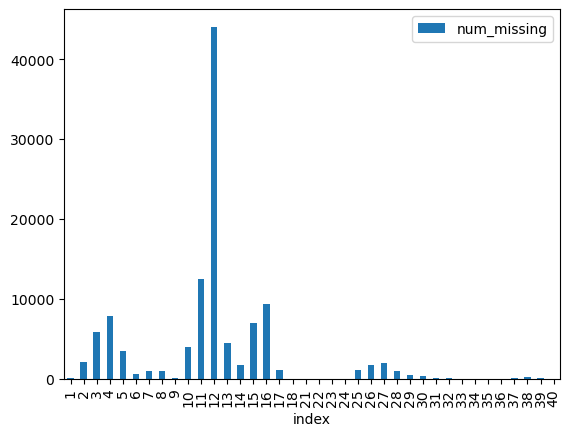

In [9]:
#checking the missing Histogram
# first create missing indicator for features with missing data
for col in df.columns:
    missing = df[col].isnull()
    num_missing = np.sum(missing)
    
    if num_missing > 0:  
        print('created missing indicator for: {}'.format(col))
        df['{}_ismissing'.format(col)] = missing


# then based on the indicator, plot the histogram of missing values
ismissing_cols = [col for col in df.columns if 'ismissing' in col]
df['num_missing'] = df[ismissing_cols].sum(axis=1)

df['num_missing'].value_counts().reset_index().sort_values(by='index').plot.bar(x='index', y='num_missing')

<AxesSubplot: >

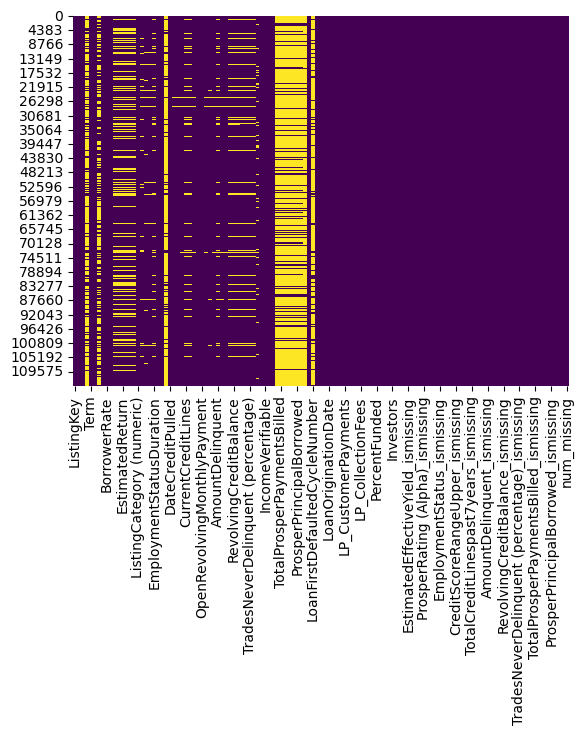

In [10]:
#visualising the missing values
sns.heatmap(df.isnull(),cbar=False,cmap='viridis')

<AxesSubplot: >

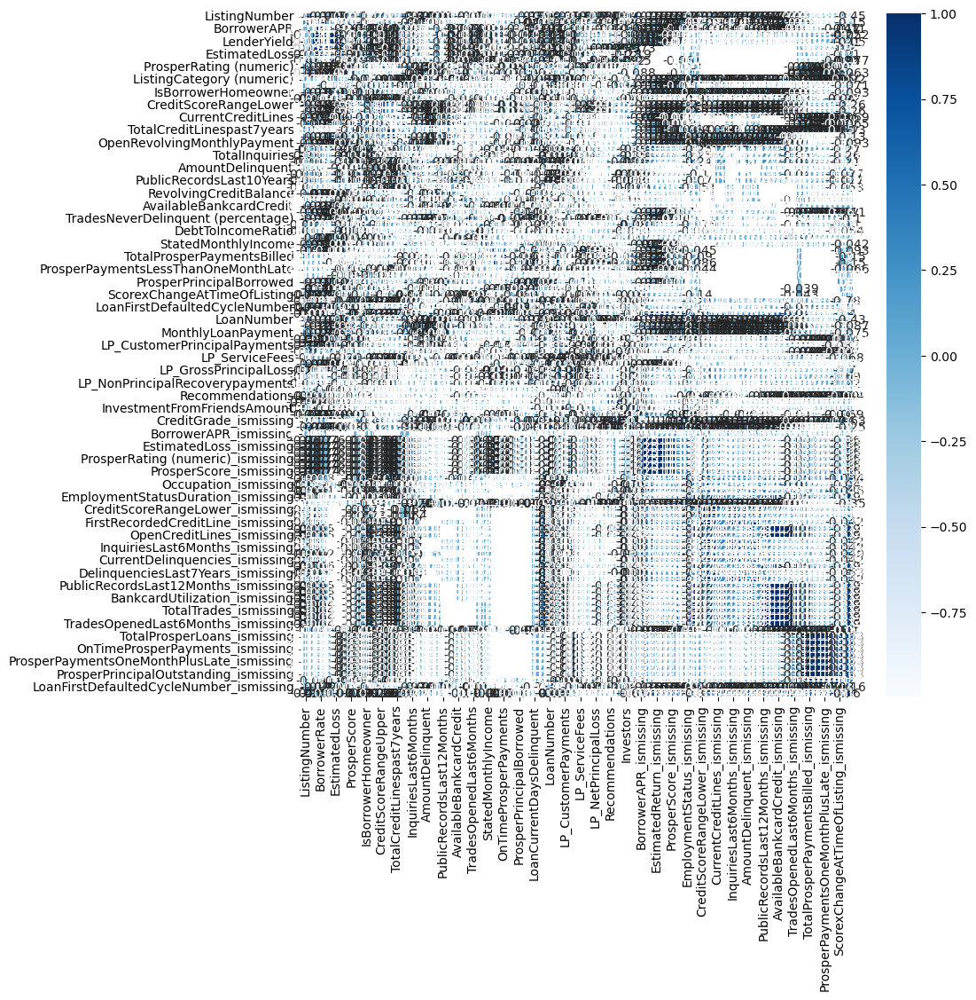

In [11]:
#Asking Analytical Questions and Visualizations
plt.figure(figsize=(10,10))
sns.heatmap(df.corr(),cbar=True,annot=True,cmap='Blues')

In [12]:
# droping the rows with a lot of missing values.
ind_missing = df[df['num_missing'] > 35].index
df_less_missing_rows = df.drop(ind_missing, axis=0)


# What is the structure of your dataset?
There are 113,937 loans in the dataset with 81 features. Most variables are numeric and categorical in nature.

The dataset features can be split into two main categories:

* Borrower information

* Loan performance information

# What features in the dataset do you think will help support your investigation into your feature(s) of interest
Though there are many features to explore, I suspect the following borrower features will have the largest effect on the performance of the loan:

* **IncomeRange** - The income range of the borrower at the time the listing was created.

* **DebToIncomeRatio** - The debt to income ratio of the borrower at the time the credit profile was pulled. This value is Null if the debt to income ratio is not available. This value is capped at 10.01 (any debt to income ratio larger than 1000% will be returned as 1001%).

* **CreditGrade** - The Credit rating that was assigned at the time the listing went live. Applicable for listings pre-2009 period and will only be populated for those listings.

* **IsBorrowerHomeowner** - A Borrower will be classified as a homowner if they have a mortgage on their credit profile or provide documentation confirming they are a homeowner.

* **ProsperRating (Alpha)** - The Prosper Rating assigned at the time the listing was created between AA - HR. Applicable for loans originated after July 2009.

* **Investors** - The number of investors that funded the loan.

* **EstimatedReturn** - The estimated return assigned to the listing at the time it was created. Estimated return is the difference between the Estimated Effective Yield and the Estimated Loss Rate. Applicable for loans originated after July 2009. This is on an annual percentage rate (APR).

<AxesSubplot: >

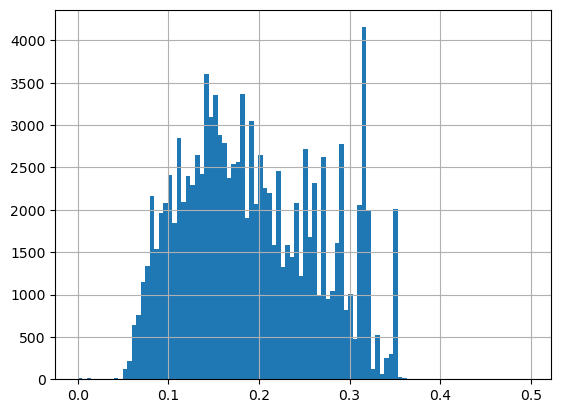

In [13]:
# histogram of Borrowerate.
df['BorrowerRate'].hist(bins=100)

<AxesSubplot: >

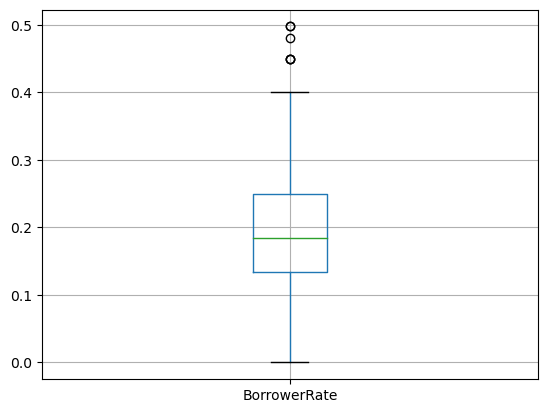

In [14]:
#boxplot of the BorrowerRate

df.boxplot(column=['BorrowerRate'])

<AxesSubplot: >

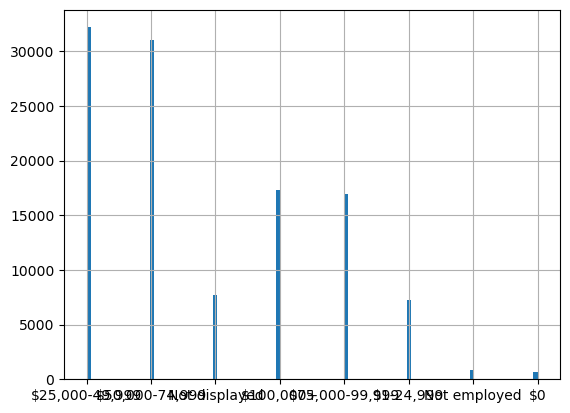

In [15]:
#checking the histogram of income Range
df['IncomeRange'].hist(bins=100)

In [16]:
#Checking the Repetative Data
num_rows = len(df.index)
low_information_cols = [] #

for col in df.columns:
    cnts = df[col].value_counts(dropna=False)
    top_pct = (cnts/num_rows).iloc[0]
    
    if top_pct > 0.95:
        low_information_cols.append(col)
        print('{0}: {1:.5f}%'.format(col, top_pct*100))
        print(cnts)
        print()

LP_NonPrincipalRecoverypayments: 97.13789%
0.00       110676
100.00         59
50.00          44
25.00          31
85.00          28
            ...  
905.93          1
1528.52         1
49.10           1
156.93          1
105.60          1
Name: LP_NonPrincipalRecoverypayments, Length: 2631, dtype: int64

PercentFunded: 99.23642%
1.0000    113067
0.9998         5
0.7000         4
0.8087         4
0.7803         3
           ...  
0.8972         1
0.8237         1
0.9113         1
0.8333         1
0.7067         1
Name: PercentFunded, Length: 719, dtype: int64

Recommendations: 96.26197%
0     109678
1       3516
2        568
3        108
4         26
5         14
9          6
7          5
6          4
8          3
18         2
16         2
14         1
21         1
24         1
19         1
39         1
Name: Recommendations, dtype: int64

InvestmentFromFriendsCount: 98.12967%
0     111806
1       1835
2        215
3         40
4         15
5          8
9          5
6          4
8    

In [17]:
#checking the captalization
df['LoanStatus'].value_counts(dropna=False)

Current                   56576
Completed                 38074
Chargedoff                11992
Defaulted                  5018
Past Due (1-15 days)        806
Past Due (31-60 days)       363
Past Due (61-90 days)       313
Past Due (91-120 days)      304
Past Due (16-30 days)       265
FinalPaymentInProgress      205
Past Due (>120 days)         16
Cancelled                     5
Name: LoanStatus, dtype: int64

In [18]:
#checking the Format of the prosperLoanData in the CSV file
df

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,...,TotalProsperLoans_ismissing,TotalProsperPaymentsBilled_ismissing,OnTimeProsperPayments_ismissing,ProsperPaymentsLessThanOneMonthLate_ismissing,ProsperPaymentsOneMonthPlusLate_ismissing,ProsperPrincipalBorrowed_ismissing,ProsperPrincipalOutstanding_ismissing,ScorexChangeAtTimeOfListing_ismissing,LoanFirstDefaultedCycleNumber_ismissing,num_missing
0,1021339766868145413AB3B,193129,2007-08-26 19:09:29.263000000,C,36,Completed,2009-08-14 00:00:00,0.16516,0.1580,0.1380,...,True,True,True,True,True,True,True,True,True,16
1,10273602499503308B223C1,1209647,2014-02-27 08:28:07.900000000,NaN,36,Current,NaN,0.12016,0.0920,0.0820,...,True,True,True,True,True,True,True,True,True,12
2,0EE9337825851032864889A,81716,2007-01-05 15:00:47.090000000,HR,36,Completed,2009-12-17 00:00:00,0.28269,0.2750,0.2400,...,True,True,True,True,True,True,True,True,True,26
3,0EF5356002482715299901A,658116,2012-10-22 11:02:35.010000000,NaN,36,Current,NaN,0.12528,0.0974,0.0874,...,True,True,True,True,True,True,True,True,True,12
4,0F023589499656230C5E3E2,909464,2013-09-14 18:38:39.097000000,NaN,36,Current,NaN,0.24614,0.2085,0.1985,...,False,False,False,False,False,False,False,True,True,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113932,E6D9357655724827169606C,753087,2013-04-14 05:55:02.663000000,NaN,36,Current,NaN,0.22354,0.1864,0.1764,...,True,True,True,True,True,True,True,True,True,12
113933,E6DB353036033497292EE43,537216,2011-11-03 20:42:55.333000000,NaN,36,FinalPaymentInProgress,NaN,0.13220,0.1110,0.1010,...,False,False,False,False,False,False,False,False,True,4
113934,E6E13596170052029692BB1,1069178,2013-12-13 05:49:12.703000000,NaN,60,Current,NaN,0.23984,0.2150,0.2050,...,True,True,True,True,True,True,True,True,True,12
113935,E6EB3531504622671970D9E,539056,2011-11-14 13:18:26.597000000,NaN,60,Completed,2013-08-13 00:00:00,0.28408,0.2605,0.2505,...,False,False,False,False,False,False,False,False,True,3


# Exploratory Data Analysis (EDA)

Before getting into modeling, we need to understand the statistical importance for better understanding.

# Histograms for numeric datatypes

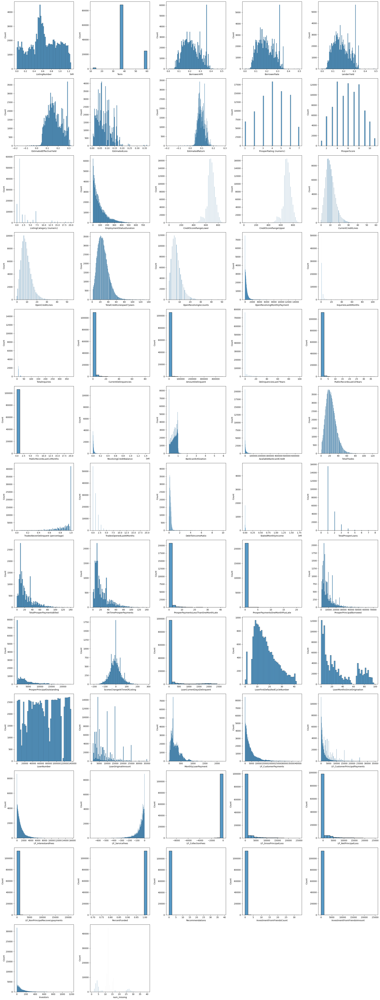

In [19]:
cols = 5
rows = 14
num_cols = df.select_dtypes(exclude=['object','bool']).columns
fig = plt.figure( figsize=(cols*5, rows*5))
for i, col in enumerate(num_cols):
    ax=fig.add_subplot(rows,cols,i+1)
    sns.histplot(x = df[col], ax = ax)
fig.tight_layout()  
plt.show()

In [20]:
df.head()

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,...,TotalProsperLoans_ismissing,TotalProsperPaymentsBilled_ismissing,OnTimeProsperPayments_ismissing,ProsperPaymentsLessThanOneMonthLate_ismissing,ProsperPaymentsOneMonthPlusLate_ismissing,ProsperPrincipalBorrowed_ismissing,ProsperPrincipalOutstanding_ismissing,ScorexChangeAtTimeOfListing_ismissing,LoanFirstDefaultedCycleNumber_ismissing,num_missing
0,1021339766868145413AB3B,193129,2007-08-26 19:09:29.263000000,C,36,Completed,2009-08-14 00:00:00,0.16516,0.1580,0.1380,...,True,True,True,True,True,True,True,True,True,16
1,10273602499503308B223C1,1209647,2014-02-27 08:28:07.900000000,NaN,36,Current,NaN,0.12016,0.0920,0.0820,...,True,True,True,True,True,True,True,True,True,12
2,0EE9337825851032864889A,81716,2007-01-05 15:00:47.090000000,HR,36,Completed,2009-12-17 00:00:00,0.28269,0.2750,0.2400,...,True,True,True,True,True,True,True,True,True,26
3,0EF5356002482715299901A,658116,2012-10-22 11:02:35.010000000,NaN,36,Current,NaN,0.12528,0.0974,0.0874,...,True,True,True,True,True,True,True,True,True,12
4,0F023589499656230C5E3E2,909464,2013-09-14 18:38:39.097000000,NaN,36,Current,NaN,0.24614,0.2085,0.1985,...,False,False,False,False,False,False,False,True,True,5


In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113937 entries, 0 to 113936
Columns: 125 entries, ListingKey to num_missing
dtypes: bool(46), float64(50), int64(12), object(17)
memory usage: 73.7+ MB


In [22]:
df.shape

(113937, 125)

In [23]:
df.describe()

,ListingNumber,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperScore,...,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors,num_missing
count,1.139370e+05,113937.000000,113912.000000,113937.000000,113937.000000,84853.000000,84853.000000,84853.000000,84853.000000,84853.000000,...,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000
mean,6.278857e+05,40.830248,0.218828,0.192764,0.182701,0.168661,0.080306,0.096068,4.072243,5.950067,...,-14.242698,700.446342,681.420499,25.142686,0.998584,0.048027,0.023460,16.550751,80.475228,11.972283
std,3.280762e+05,10.436212,0.080364,0.074818,0.074516,0.068467,0.046764,0.030403,1.673227,2.376501,...,109.232758,2388.513831,2357.167068,275.657937,0.017919,0.332353,0.232412,294.545422,103.239020,5.719863
min,4.000000e+00,12.000000,0.006530,0.000000,-0.010000,-0.182700,0.004900,-0.182700,1.000000,1.000000,...,-9274.750000,-94.200000,-954.550000,0.000000,0.700000,0.000000,0.000000,0.000000,1.000000,1.000000
25%,4.009190e+05,36.000000,0.156290,0.134000,0.124200,0.115670,0.042400,0.074080,3.000000,4.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,2.000000,11.000000
50%,6.005540e+05,36.000000,0.209760,0.184000,0.173000,0.161500,0.072400,0.091700,4.000000,6.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,44.000000,12.000000
75%,8.926340e+05,36.000000,0.283810,0.250000,0.240000,0.224300,0.112000,0.116600,5.000000,8.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,115.000000,13.000000
max,1.255725e+06,60.000000,0.512290,0.497500,0.492500,0.319900,0.366000,0.283700,7.000000,11.000000,...,0.000000,25000.000000,25000.000000,21117.900000,1.012500,39.000000,33.000000,25000.000000,1189.000000,40.000000


<AxesSubplot: >

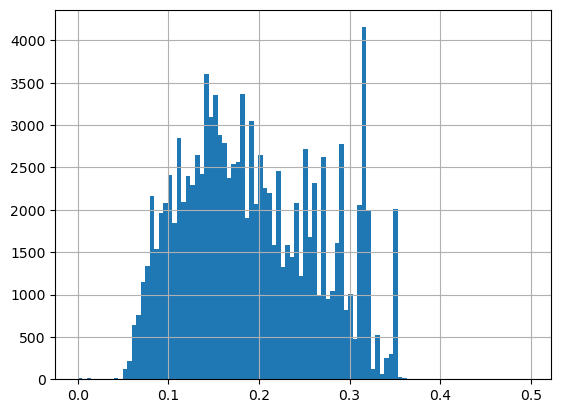

In [24]:
# histogram of Borrowerate.
df['BorrowerRate'].hist(bins=100)

<AxesSubplot: >

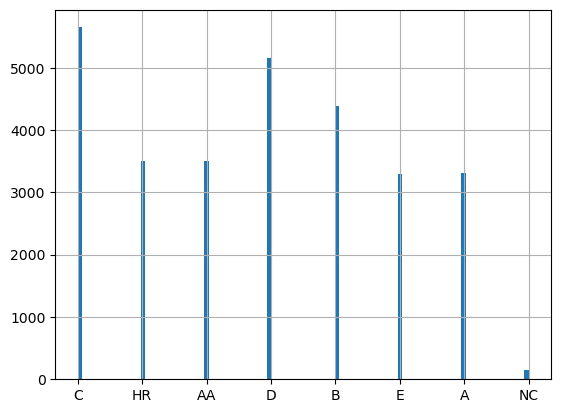

In [25]:
df['CreditGrade'].hist(bins=100)

<AxesSubplot: xlabel='count', ylabel='CreditGrade'>

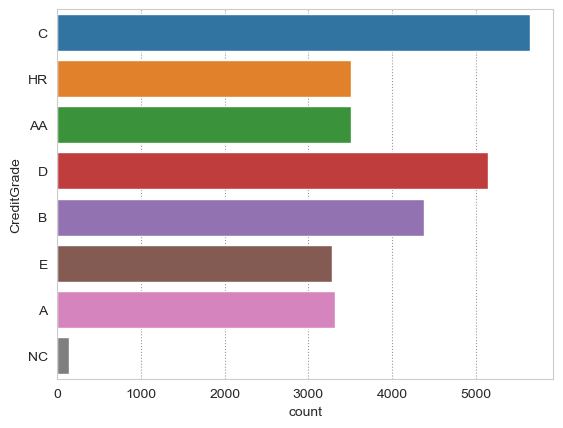

In [26]:
#Reading the histogram of the employeementStatus
sns.set_style("whitegrid", {"grid.color": ".6", "grid.linestyle": ":"})
sns.countplot(y='CreditGrade',data=df)

<AxesSubplot: >

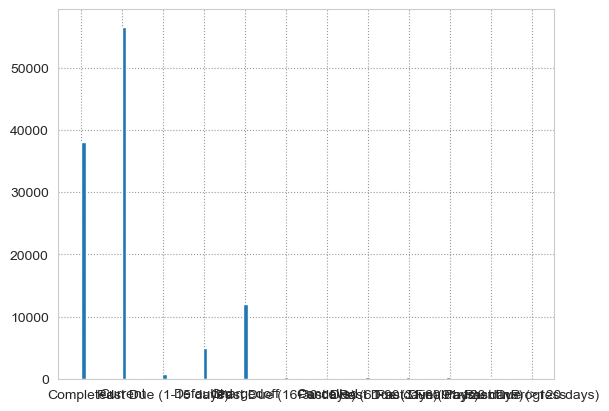

In [27]:
# Check the univariate relationship of Loan Status
# sns.set(rc={'figure.figsize':(28.7,5.27)})
# sns.set_style("whitegrid")
# sns.countplot(x='LoanStatus',data=df )
df['LoanStatus'].hist(bins=100)

<AxesSubplot: >

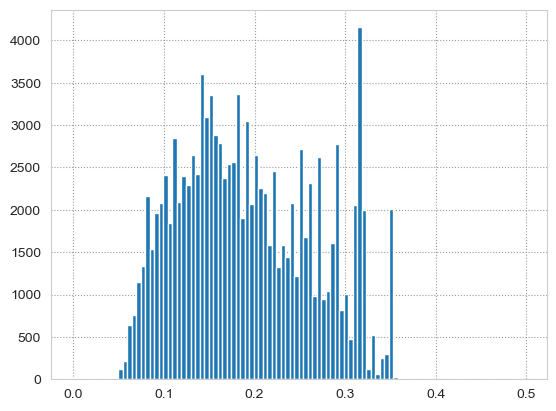

In [28]:
# Check the univariate relationship of Borrower rate
df['BorrowerRate'].hist(bins=100)

<AxesSubplot: >

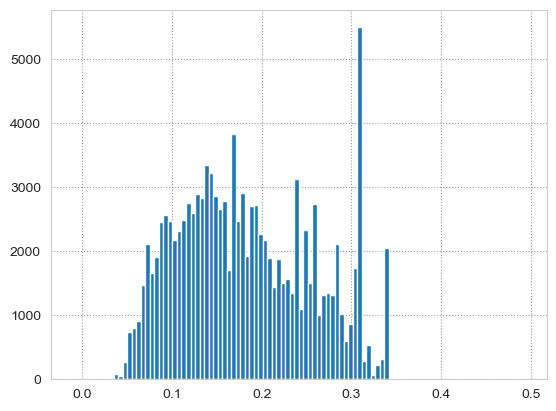

In [29]:
# Check the univariate relationship of Lender Yield on Loan
df['LenderYield'].hist(bins=100)

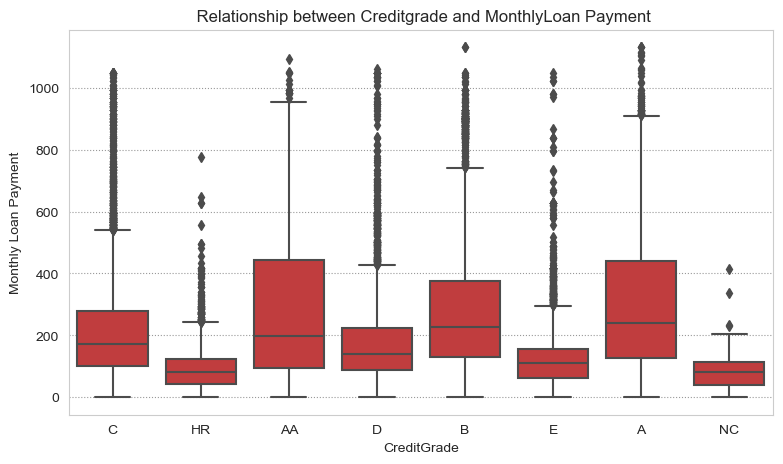

In [30]:
base_color = sns.color_palette()[3]
plt.figure(figsize = [20, 5])
plt.subplot(1, 2, 2)
sns.boxplot(data=df,x='CreditGrade',y='MonthlyLoanPayment',color=base_color);
plt.xlabel('CreditGrade');
plt.ylabel('Monthly Loan Payment');
plt.title(' Relationship between Creditgrade and MonthlyLoan Payment');

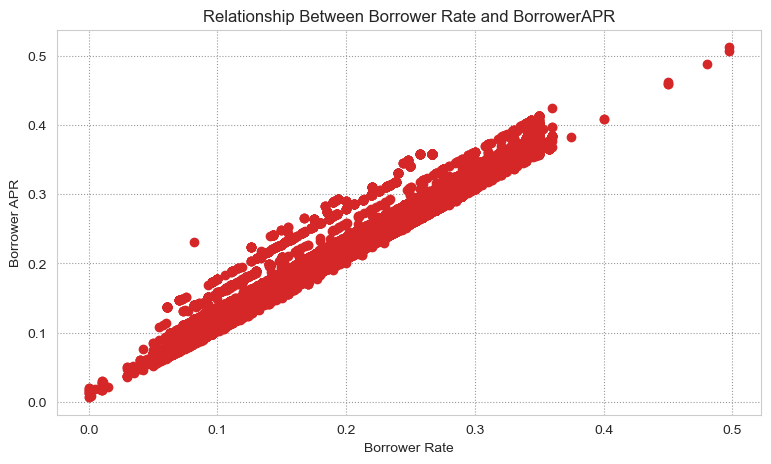

In [31]:
# Check the Multivariate Relationship between BorrowerRate and BorrowerAPR.

plt.figure(figsize = [20, 5])
plt.subplot(1, 2, 1)
plt.scatter(data=df,x='BorrowerRate',y='BorrowerAPR',color=base_color);
plt.xlabel('Borrower Rate');
plt.ylabel('Borrower APR');
plt.title('Relationship Between Borrower Rate and BorrowerAPR');

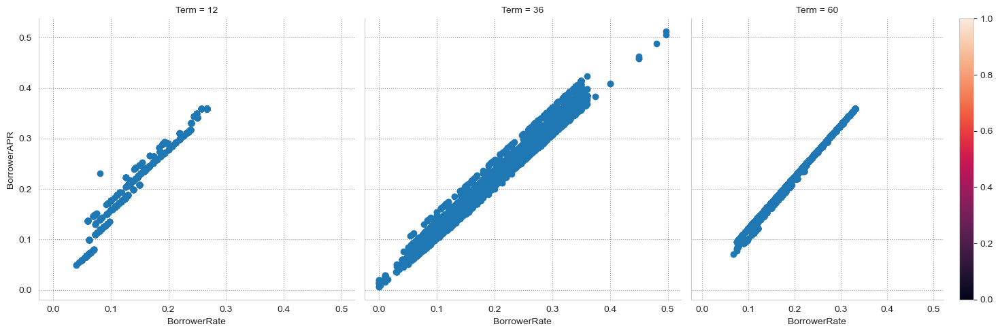

In [32]:
import seaborn as sns
# Check the Multivariate Relationship between BorrowerRate and BorrowerAPR.
g = sns.FacetGrid(data = df, col = 'Term', height = 5,
                margin_titles = True)
g.map(plt.scatter, 'BorrowerRate', 'BorrowerAPR');
plt.colorbar()

# Checking target incidence

In [33]:
df = df[df["LoanStatus"] != "Current"]
df["LoanStatus"].value_counts()

Completed                 38074
Chargedoff                11992
Defaulted                  5018
Past Due (1-15 days)        806
Past Due (31-60 days)       363
Past Due (61-90 days)       313
Past Due (91-120 days)      304
Past Due (16-30 days)       265
FinalPaymentInProgress      205
Past Due (>120 days)         16
Cancelled                     5
Name: LoanStatus, dtype: int64

In [34]:
df["LoanStatus"] = (df["LoanStatus"] == "Completed").astype(int)
df["LoanStatus"][:10]

0     1
2     1
11    1
12    0
15    0
17    0
21    1
23    0
26    1
27    1
Name: LoanStatus, dtype: int32

<AxesSubplot: xlabel='count', ylabel='LoanStatus'>

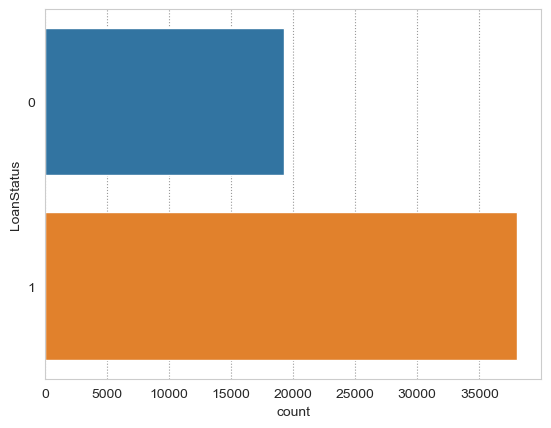

In [35]:
#Reading the histogram of the loanStatus
sns.set_style("whitegrid", {"grid.color": ".6", "grid.linestyle": ":"})
sns.countplot(y='LoanStatus',data=df)

<AxesSubplot: xlabel='count', ylabel='EmploymentStatus'>

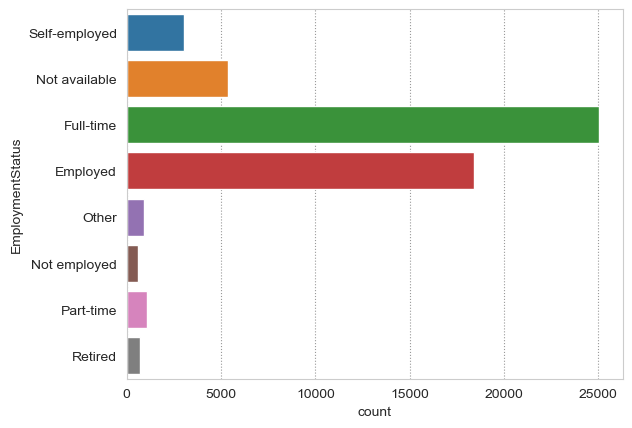

In [36]:
#Reading the histogram of the employeementStatus
sns.set_style("whitegrid", {"grid.color": ".6", "grid.linestyle": ":"})
sns.countplot(y='EmploymentStatus',data=df)

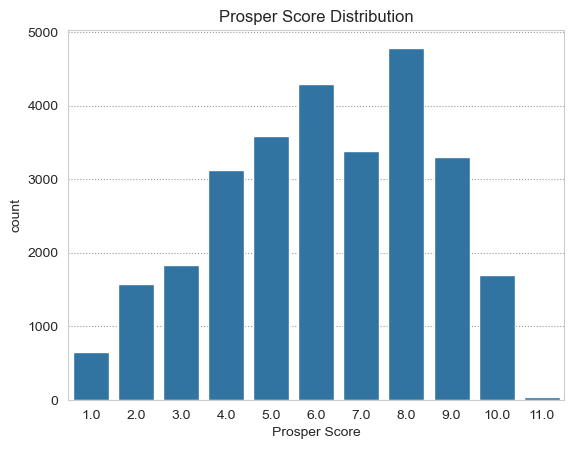

In [37]:
#Prosper Score Distribution
base_color = sns.color_palette()[0]
sns.countplot(data=df,x= 'ProsperScore',color=base_color)
plt.title('Prosper Score Distribution')
plt.xlabel('Prosper Score');


#### Prosper score of value 4 and 6 and 8 are the most common.

**States California, Texas and New York have the 3 biggest numbers of loans originated in that period of time.**

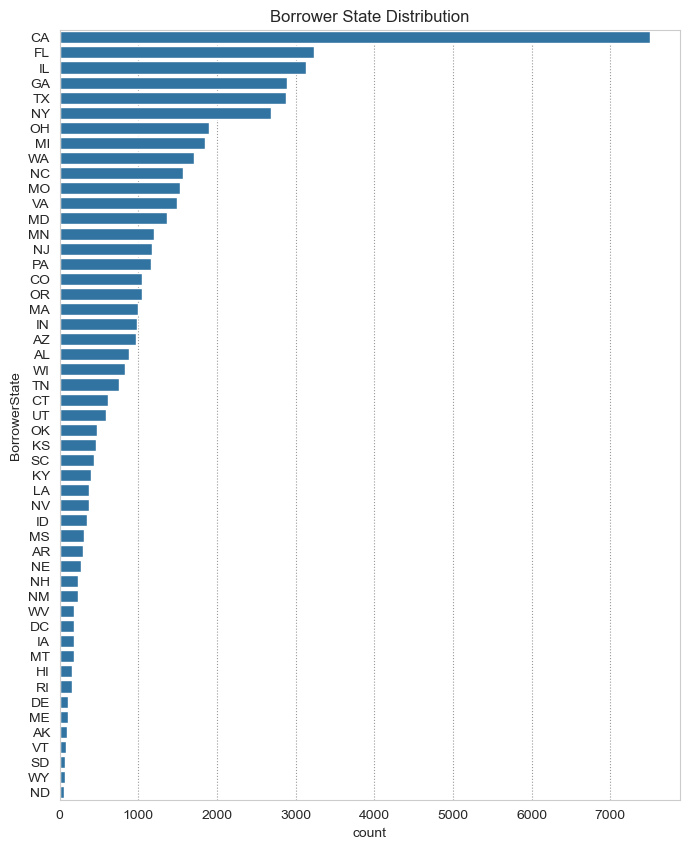

In [38]:
#Borrower State Distrobution
cat_order = df.BorrowerState.value_counts().index
plt.figure(figsize=[8, 10])
sns.countplot(data=df,y='BorrowerState',color=base_color, order=cat_order);
plt.title('Borrower State Distribution');

**Most borrowers' occupations (excluding the others group) are: Professional, Computer Engineer and Executive. It is interesting to see that Students, Judges, Dentists and Biologists are the least occupations taking loans.**


Text(0.5, 1.0, 'Borrower Occupation Distribution')

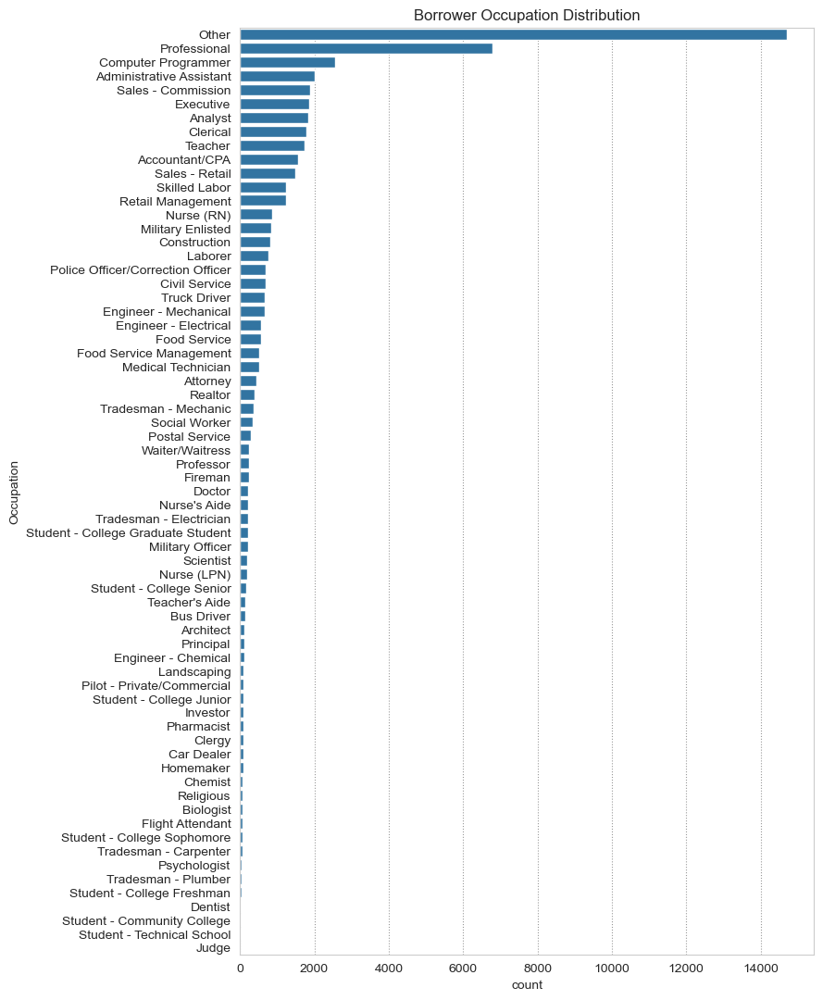

In [39]:
#Borrower Occupation Distrobution
cat_order = df.Occupation.value_counts().index
plt.figure(figsize=[8, 13])
sns.countplot(data=df,y='Occupation',color=base_color, order=cat_order);
plt.title('Borrower Occupation Distribution')

**cheking the prosper loan payment that has been delayed one month**

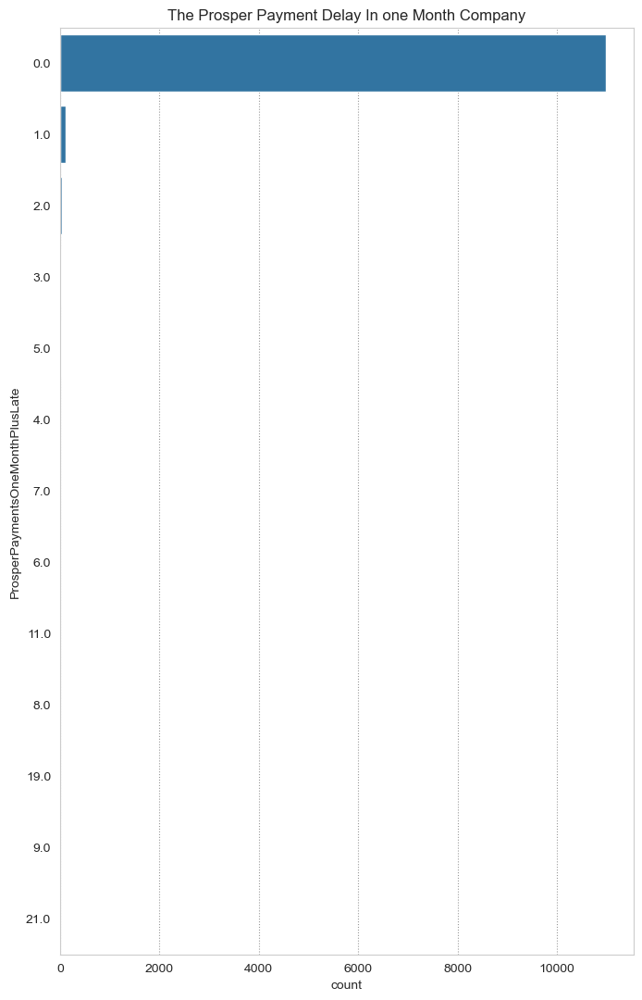

In [40]:
cat_order = df.ProsperPaymentsOneMonthPlusLate.value_counts().index
plt.figure(figsize=[8, 13])
sns.countplot(data=df,y='ProsperPaymentsOneMonthPlusLate',color=base_color, order=cat_order);
plt.title('The Prosper Payment Delay In one Month Company');

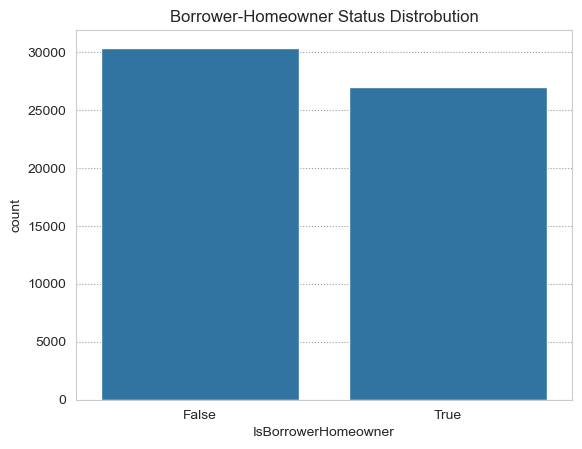

In [41]:
#Is Borrower-Homeowner Status Distrobution
base_color = sns.color_palette()[0]
sns.countplot(data=df,x= 'IsBorrowerHomeowner',color=base_color);
plt.title('Borrower-Homeowner Status Distrobution')
plt.xlabel('IsBorrowerHomeowner');

# Borrower APR vs Status of Loan and Borrower APR vs Employment status
- **On the left:** Current and completed loans have lower rate than the past-due loans
- **On the right:** Employed people have lower rates than not employed

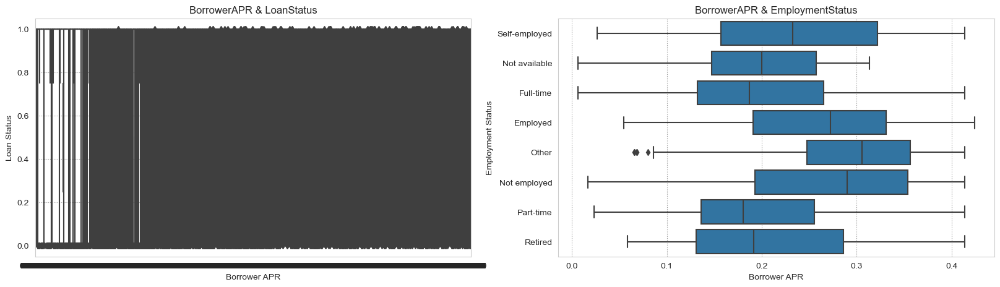

In [42]:
plt.figure(figsize = [20, 5])

plt.subplot(1, 2, 1)
sns.boxplot(data=df,x='BorrowerAPR',y='LoanStatus',color=base_color);
plt.xlabel('Borrower APR');
plt.ylabel('Loan Status');
plt.title('BorrowerAPR & LoanStatus');

plt.subplot(1, 2, 2)
sns.boxplot(data=df,x='BorrowerAPR',y='EmploymentStatus',color=base_color);
plt.xlabel('Borrower APR');
plt.ylabel('Employment Status');
plt.title('BorrowerAPR & EmploymentStatus');

**Employed people can get larger loan amounts compared to all other categories.**

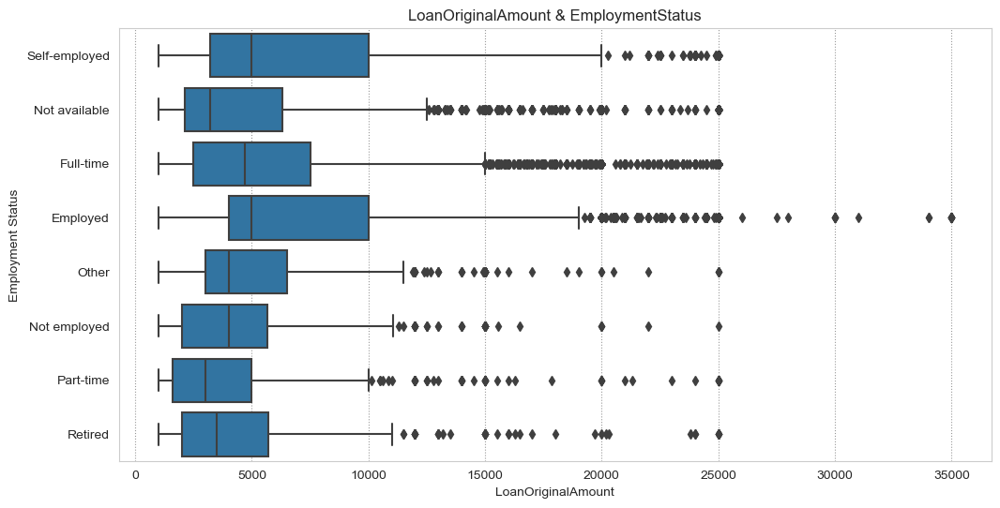

In [43]:
plt.figure(figsize = [12, 6])
sns.boxplot(data=df,x='LoanOriginalAmount',y='EmploymentStatus',color=base_color);
plt.xlabel('LoanOriginalAmount');
plt.ylabel('Employment Status');
plt.title('LoanOriginalAmount & EmploymentStatus');

In [44]:
df.shape

(57361, 125)

In [45]:
#displayinng the duplicates data into the loan data 
df.duplicated().sum()

0

In [46]:
# Changing Loan orgination date into date time format
df['LoanOriginationDate'] = pd.to_datetime(df['LoanOriginationDate'])

In [47]:

# Changing Loan orgination date into date time format
df['ListingCreationDate'] = pd.to_datetime(df['ListingCreationDate'])

In [48]:
#check missing value
df.isnull().sum()

ListingKey                                     0
ListingNumber                                  0
ListingCreationDate                            0
CreditGrade                                28408
Term                                           0
                                           ...  
ProsperPrincipalBorrowed_ismissing             0
ProsperPrincipalOutstanding_ismissing          0
ScorexChangeAtTimeOfListing_ismissing          0
LoanFirstDefaultedCycleNumber_ismissing        0
num_missing                                    0
Length: 125, dtype: int64

In [49]:
df.describe()

,ListingNumber,Term,LoanStatus,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),...,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors,num_missing
count,5.736100e+04,57361.000000,57361.000000,57336.000000,57361.000000,57361.000000,28277.000000,28277.000000,28277.000000,28277.000000,...,57361.000000,57361.000000,57361.000000,57361.000000,57361.000000,57361.00000,57361.000000,57361.000000,57361.000000,57361.000000
mean,3.823449e+05,37.199142,0.663761,0.223848,0.201634,0.191509,0.178799,0.094160,0.107756,3.639707,...,-26.463754,1391.306897,1353.515584,49.941289,0.998504,0.08633,0.044420,32.297477,103.490961,13.326302
std,2.207634e+05,7.649302,0.472426,0.087895,0.080952,0.080409,0.080493,0.054206,0.037443,1.796018,...,151.544802,3220.373358,3182.266984,386.907614,0.018478,0.44570,0.321445,413.801196,108.269124,7.205227
min,4.000000e+00,12.000000,0.000000,0.006530,0.000000,-0.010000,-0.182700,0.004900,-0.182700,1.000000,...,-9274.750000,-94.200000,-954.550000,0.000000,0.700000,0.00000,0.000000,0.000000,1.000000,1.000000
25%,1.962330e+05,36.000000,0.000000,0.152110,0.136400,0.125900,0.116600,0.054900,0.079600,2.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,30.000000,10.000000
50%,4.037230e+05,36.000000,1.000000,0.217390,0.198000,0.185000,0.175800,0.098000,0.113480,3.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,68.000000,12.000000
75%,5.355710e+05,36.000000,1.000000,0.295540,0.269900,0.259900,0.251200,0.140000,0.135700,5.000000,...,0.000000,1226.570000,1082.610000,0.000000,1.000000,0.00000,0.000000,0.000000,140.000000,16.000000
max,1.240719e+06,60.000000,1.000000,0.512290,0.497500,0.492500,0.319900,0.366000,0.283700,7.000000,...,0.000000,25000.000000,25000.000000,21117.900000,1.011000,39.00000,33.000000,25000.000000,1189.000000,40.000000


<AxesSubplot: xlabel='BorrowerAPR', ylabel='Density'>

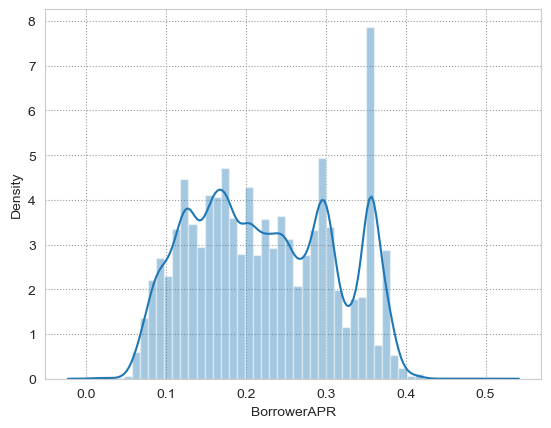

In [50]:
sns.distplot(df['BorrowerAPR']) 

<AxesSubplot: xlabel='EmploymentStatusDuration', ylabel='Density'>

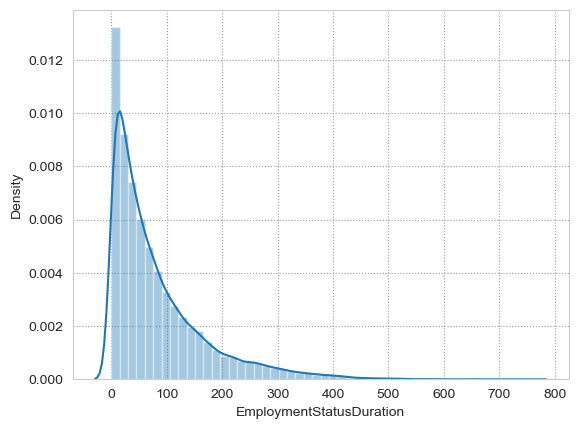

In [51]:
sns.distplot(df['EmploymentStatusDuration']) 

<AxesSubplot: xlabel='ProsperScore', ylabel='Density'>

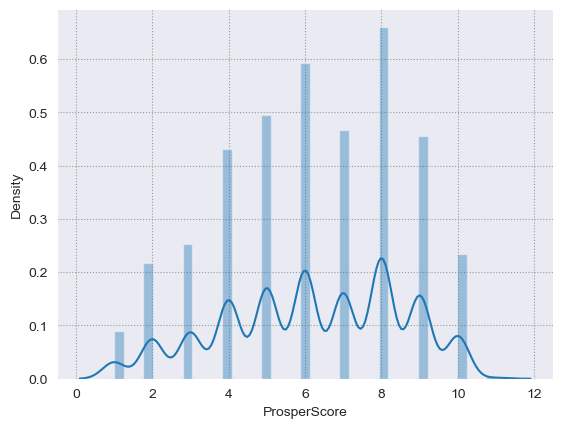

In [52]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
sns.distplot(df['ProsperScore']) 

<AxesSubplot: ylabel='TotalProsperLoans'>

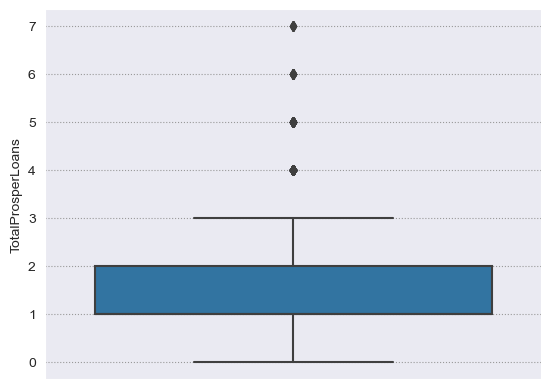

In [53]:
sns.set_style("darkgrid", {"grid.color": ".6", "grid.linestyle": ":"})
sns.boxplot(y='TotalProsperLoans',data=df)

In [54]:
#categorical data (There is no outlier detection for categorical data)
df['CreditGrade'].value_counts()

C     5649
D     5153
B     4389
AA    3509
HR    3508
A     3315
E     3289
NC     141
Name: CreditGrade, dtype: int64

<AxesSubplot: xlabel='CreditGrade', ylabel='count'>

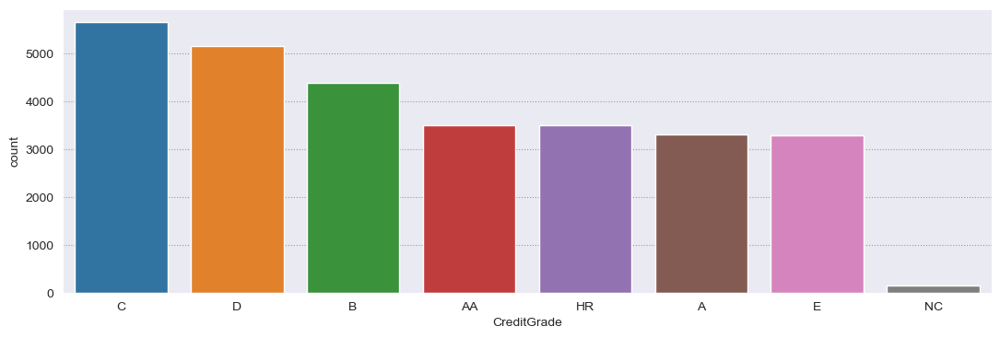

In [55]:
plt.figure(figsize = (13,4))
sns.countplot(data=df, x='CreditGrade', order=df.CreditGrade.value_counts().index)

In [56]:
df['LoanStatus'].value_counts()

1    38074
0    19287
Name: LoanStatus, dtype: int64

In [57]:
df['Occupation'].value_counts()

Other                          14698
Professional                    6786
Computer Programmer             2571
Administrative Assistant        2017
Sales - Commission              1888
                               ...  
Student - College Freshman        35
Dentist                           25
Student - Community College       25
Student - Technical School        15
Judge                              3
Name: Occupation, Length: 67, dtype: int64

In [58]:
df['EmploymentStatus'].value_counts()

Full-time        25039
Employed         18393
Not available     5347
Self-employed     3049
Part-time         1064
Other              924
Retired            703
Not employed       587
Name: EmploymentStatus, dtype: int64

<AxesSubplot: xlabel='EmploymentStatus', ylabel='count'>

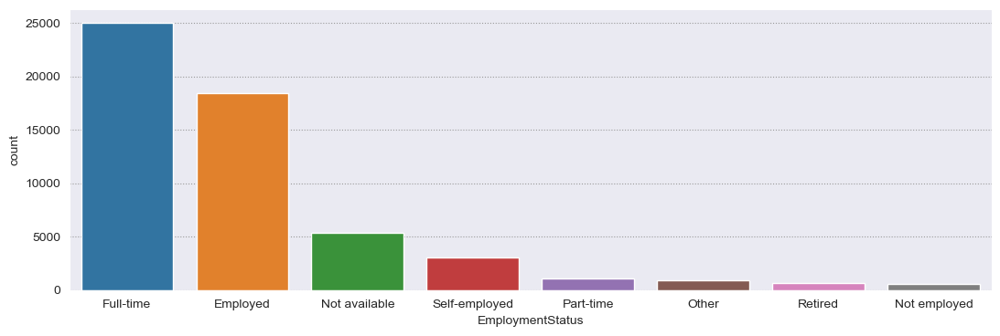

In [59]:
plt.figure(figsize = (13,4))
sns.countplot(data=df, x='EmploymentStatus', order=df.EmploymentStatus.value_counts().index)

In [60]:
df['IncomeRange'].value_counts()

$25,000-49,999    17081
$50,000-74,999    13435
Not displayed      7741
$75,000-99,999     6777
$100,000+          6421
$1-24,999          4738
$0                  610
Not employed        558
Name: IncomeRange, dtype: int64

<AxesSubplot: xlabel='IncomeRange', ylabel='count'>

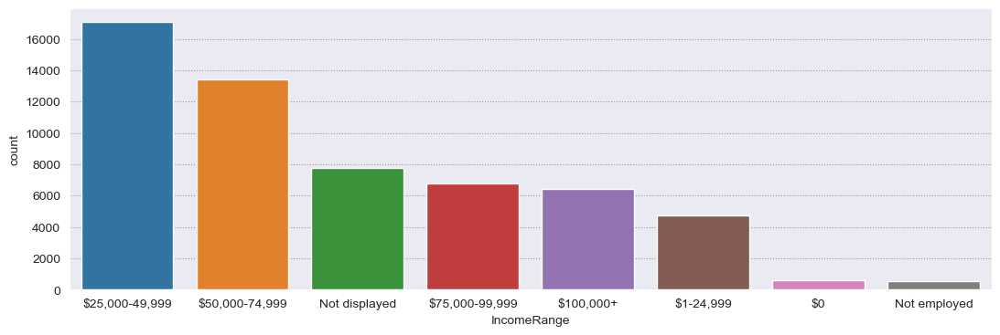

In [61]:
plt.figure(figsize = (13,4))
sns.countplot(data=df, x='IncomeRange', order=df.IncomeRange.value_counts().index)

In [62]:
df_loan = df.copy()

In [63]:
### Dropping column
df_loan.drop(['ListingCreationDate','LoanOriginationDate','GroupKey','CreditGrade','ProsperPrincipalBorrowed','ProsperPrincipalOutstanding','EstimatedEffectiveYield','EstimatedLoss','EstimatedReturn','ProsperRating (numeric)',
        'TotalProsperLoans','TotalProsperPaymentsBilled','OnTimeProsperPayments','ProsperPaymentsLessThanOneMonthLate','ProsperPaymentsOneMonthPlusLate','ListingKey'], axis =1, inplace = True)
df_loan.head()

,ListingNumber,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),...,TotalProsperLoans_ismissing,TotalProsperPaymentsBilled_ismissing,OnTimeProsperPayments_ismissing,ProsperPaymentsLessThanOneMonthLate_ismissing,ProsperPaymentsOneMonthPlusLate_ismissing,ProsperPrincipalBorrowed_ismissing,ProsperPrincipalOutstanding_ismissing,ScorexChangeAtTimeOfListing_ismissing,LoanFirstDefaultedCycleNumber_ismissing,num_missing
0,193129,36,1,2009-08-14 00:00:00,0.16516,0.1580,0.1380,NaN,NaN,0,...,True,True,True,True,True,True,True,True,True,16
2,81716,36,1,2009-12-17 00:00:00,0.28269,0.2750,0.2400,NaN,NaN,0,...,True,True,True,True,True,True,True,True,True,26
11,213551,36,1,2008-01-07 00:00:00,0.15033,0.1325,0.1225,NaN,NaN,0,...,True,True,True,True,True,True,True,True,True,17
12,1081604,36,0,NaN,0.17969,0.1435,0.1335,B,4.0,1,...,True,True,True,True,True,True,True,True,True,12
15,577164,36,0,2012-12-19 00:00:00,0.35797,0.3177,0.3077,HR,5.0,13,...,True,True,True,True,True,True,True,True,False,10


In [64]:
df_loan.info()
df

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57361 entries, 0 to 113935
Columns: 109 entries, ListingNumber to num_missing
dtypes: bool(46), float64(39), int32(1), int64(12), object(11)
memory usage: 30.3+ MB


,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,...,TotalProsperLoans_ismissing,TotalProsperPaymentsBilled_ismissing,OnTimeProsperPayments_ismissing,ProsperPaymentsLessThanOneMonthLate_ismissing,ProsperPaymentsOneMonthPlusLate_ismissing,ProsperPrincipalBorrowed_ismissing,ProsperPrincipalOutstanding_ismissing,ScorexChangeAtTimeOfListing_ismissing,LoanFirstDefaultedCycleNumber_ismissing,num_missing
0,1021339766868145413AB3B,193129,2007-08-26 19:09:29.263,C,36,1,2009-08-14 00:00:00,0.16516,0.1580,0.1380,...,True,True,True,True,True,True,True,True,True,16
2,0EE9337825851032864889A,81716,2007-01-05 15:00:47.090,HR,36,1,2009-12-17 00:00:00,0.28269,0.2750,0.2400,...,True,True,True,True,True,True,True,True,True,26
11,0F1734025150298088A5F2B,213551,2007-10-09 20:28:33.640,C,36,1,2008-01-07 00:00:00,0.15033,0.1325,0.1225,...,True,True,True,True,True,True,True,True,True,17
12,0F1A3597143888805163EF7,1081604,2013-12-15 20:01:10.757,NaN,36,0,NaN,0.17969,0.1435,0.1335,...,True,True,True,True,True,True,True,True,True,12
15,0F483544120452347F48121,577164,2012-04-10 09:14:46.297,NaN,36,0,2012-12-19 00:00:00,0.35797,0.3177,0.3077,...,True,True,True,True,True,True,True,True,False,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113927,E3433419834735803891976,322787,2008-04-30 21:25:19.670,AA,36,1,2011-05-09 00:00:00,0.07469,0.0679,0.0579,...,False,False,False,False,False,False,False,False,True,7
113928,E34935176664905343E01EA,510097,2011-06-06 19:02:44.443,NaN,36,1,2011-09-19 00:00:00,0.22362,0.1899,0.1799,...,False,False,False,False,False,False,False,False,True,3
113929,E3553583161337791FCB87F,830413,2013-07-06 17:40:01.657,NaN,36,1,2014-02-07 00:00:00,0.30285,0.2639,0.2539,...,True,True,True,True,True,True,True,True,True,11
113933,E6DB353036033497292EE43,537216,2011-11-03 20:42:55.333,NaN,36,0,NaN,0.13220,0.1110,0.1010,...,False,False,False,False,False,False,False,False,True,4


# Preprocessing: imputation of missing values

In [65]:
categorical = df.select_dtypes(include=['bool','object']).columns
numerical=df.select_dtypes('number').columns
df_c = df[categorical].copy()
df_n = df[numerical].copy()

In [66]:
from sklearn.impute import SimpleImputer
imp = SimpleImputer(missing_values=np.nan, strategy="mean")
imp.fit(df_n)
df_num_imputed = imp.transform(df_n)

In [67]:
from sklearn.impute import SimpleImputer
imp = SimpleImputer(missing_values=np.nan, strategy="most_frequent")
imp.fit(df_c)
df_cat_imputed = imp.transform(df_c)

In [68]:
df_c= pd.DataFrame(df_cat_imputed, columns=df_c.columns.tolist())
df_n= pd.DataFrame(df_num_imputed, columns=df_n.columns.tolist())
data=pd.concat([df_n,df_c],axis=1)

In [69]:
data.head()

,ListingNumber,Term,LoanStatus,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),...,DebtToIncomeRatio_ismissing,TotalProsperLoans_ismissing,TotalProsperPaymentsBilled_ismissing,OnTimeProsperPayments_ismissing,ProsperPaymentsLessThanOneMonthLate_ismissing,ProsperPaymentsOneMonthPlusLate_ismissing,ProsperPrincipalBorrowed_ismissing,ProsperPrincipalOutstanding_ismissing,ScorexChangeAtTimeOfListing_ismissing,LoanFirstDefaultedCycleNumber_ismissing
0,193129.0,36.0,1.0,0.16516,0.1580,0.1380,0.178799,0.09416,0.107756,3.639707,...,False,True,True,True,True,True,True,True,True,True
1,81716.0,36.0,1.0,0.28269,0.2750,0.2400,0.178799,0.09416,0.107756,3.639707,...,False,True,True,True,True,True,True,True,True,True
2,213551.0,36.0,1.0,0.15033,0.1325,0.1225,0.178799,0.09416,0.107756,3.639707,...,False,True,True,True,True,True,True,True,True,True
3,1081604.0,36.0,0.0,0.17969,0.1435,0.1335,0.126400,0.05240,0.074000,5.000000,...,False,True,True,True,True,True,True,True,True,True
4,577164.0,36.0,0.0,0.35797,0.3177,0.3077,0.289600,0.16500,0.124600,1.000000,...,False,True,True,True,True,True,True,True,True,False


In [70]:
print(str('Any missing data or NaN in the dataset:'),data.isnull().values.any())

Any missing data or NaN in the dataset: False


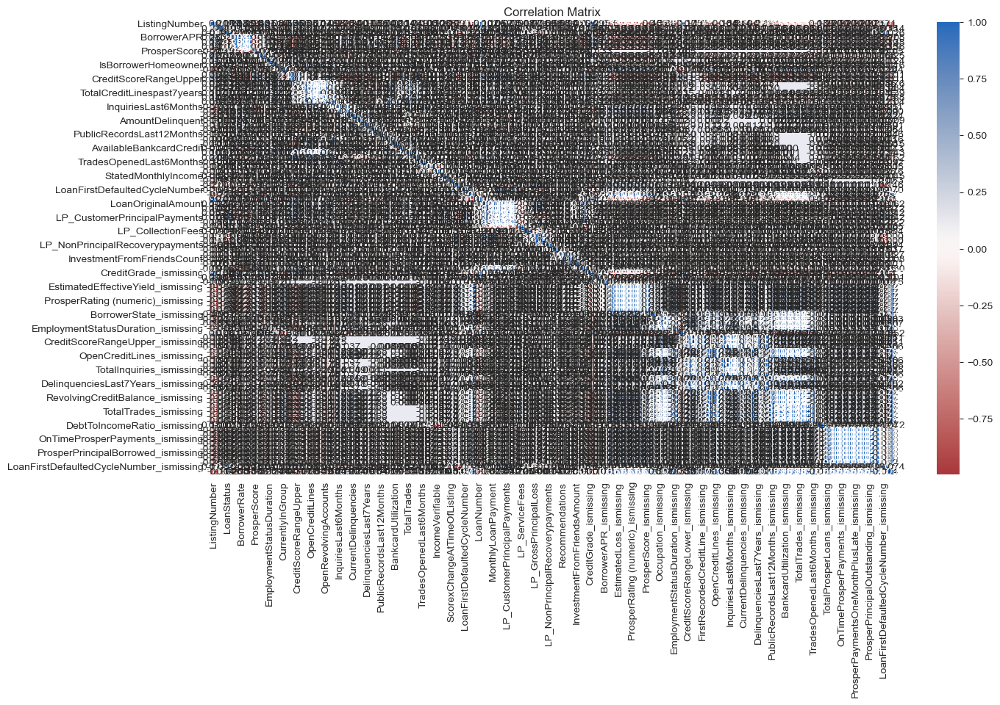

In [71]:
# Matrix of correlations for all numerical variables
plt.figure(figsize = [15, 8])
sns.heatmap(df_loan.corr(), annot = True, fmt = '.3f',
           cmap = 'vlag_r', center = 0)
plt.title('Correlation Matrix') 
plt.margins(x = 0.5, y= 0.3)
plt.show()

In [72]:
df_loan.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 57361 entries, 0 to 113935
Columns: 109 entries, ListingNumber to num_missing
dtypes: bool(46), float64(39), int32(1), int64(12), object(11)
memory usage: 30.3+ MB


# Encoding the categorical columns

In [73]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
cols = ['LoanStatus','ClosedDate','ProsperRating (Alpha)','BorrowerState','Occupation','EmploymentStatus','FirstRecordedCreditLine',
       'IsBorrowerHomeowner','CurrentlyInGroup','DateCreditPulled','IncomeRange','IncomeVerifiable','LoanKey','LoanOriginationQuarter',
       'MemberKey']

df_loan[cols] = df_loan[cols].apply(LabelEncoder().fit_transform)

In [74]:
df_loan.head()

,ListingNumber,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),...,TotalProsperLoans_ismissing,TotalProsperPaymentsBilled_ismissing,OnTimeProsperPayments_ismissing,ProsperPaymentsLessThanOneMonthLate_ismissing,ProsperPaymentsOneMonthPlusLate_ismissing,ProsperPrincipalBorrowed_ismissing,ProsperPrincipalOutstanding_ismissing,ScorexChangeAtTimeOfListing_ismissing,LoanFirstDefaultedCycleNumber_ismissing,num_missing
0,193129,36,1,1136,0.16516,0.1580,0.1380,7,NaN,0,...,True,True,True,True,True,True,True,True,True,16
2,81716,36,1,1261,0.28269,0.2750,0.2400,7,NaN,0,...,True,True,True,True,True,True,True,True,True,26
11,213551,36,1,536,0.15033,0.1325,0.1225,7,NaN,0,...,True,True,True,True,True,True,True,True,True,17
12,1081604,36,0,2802,0.17969,0.1435,0.1335,2,4.0,1,...,True,True,True,True,True,True,True,True,True,12
15,577164,36,0,2355,0.35797,0.3177,0.3077,6,5.0,13,...,True,True,True,True,True,True,True,True,False,10


# Encoding
In datasets we may contain object datatypes. for building a model we need to have all features are in integer datatypes. so, Label Encoder are used to convert object datatype to integer datatype.

In [75]:
from sklearn.preprocessing import LabelEncoder
cat_list = [] 
num_list = []
for colname, colvalue in df_c.iteritems():
        cat_list.append(colname)
for col in cat_list:
    encoder = LabelEncoder()
    encoder.fit(df_c[col])
    df_c[col] = encoder.transform(df_c[col])

L=df_c.columns.to_list()
df_c = pd.DataFrame(df_c, columns=L)
data=pd.concat([df_c,data],axis=1)

data = data.select_dtypes(exclude=['object'])
data.head()

,ListingKey,CreditGrade,ClosedDate,ProsperRating (Alpha),BorrowerState,Occupation,EmploymentStatus,IsBorrowerHomeowner,CurrentlyInGroup,GroupKey,...,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors,num_missing
0,3630,3,1136,4,5,35,7,1,1,330,...,0.0,0.00,0.00,0.0,1.0,0.0,0.0,0.0,258.0,16.0
1,3368,6,1261,4,10,35,2,0,1,330,...,0.0,0.00,0.00,0.0,1.0,0.0,0.0,0.0,41.0,26.0
2,3397,3,536,4,4,66,1,0,0,330,...,0.0,0.00,0.00,0.0,1.0,0.0,0.0,0.0,53.0,17.0
3,3404,3,2795,2,1,48,0,0,0,330,...,0.0,0.00,0.00,0.0,1.0,0.0,0.0,0.0,1.0,12.0
4,3443,3,2355,6,9,35,4,1,0,330,...,0.0,3790.25,3790.25,0.0,1.0,0.0,0.0,0.0,10.0,10.0


# Feature Engineering


# Feature Selection
**by using mutual_info_classif**

In [76]:
X = data.copy()
y = X.pop("LoanStatus")
from sklearn.feature_selection import mutual_info_classif
mutual_info = mutual_info_classif(X, y)
mutual_info = pd.Series(mutual_info)
mutual_info.index = X.columns
mutual_info.sort_values(ascending=False)

LoanCurrentDaysDelinquent                  0.616071
LP_CustomerPrincipalPayments               0.531190
LoanFirstDefaultedCycleNumber              0.484012
LP_GrossPrincipalLoss                      0.480596
LoanFirstDefaultedCycleNumber_ismissing    0.480052
                                             ...   
Recommendations                            0.000000
CurrentDelinquencies_ismissing             0.000000
InvestmentFromFriendsAmount                0.000000
Investors                                  0.000000
InquiriesLast6Months_ismissing             0.000000
Length: 122, dtype: float64

Text(0.5, 0, 'Features')

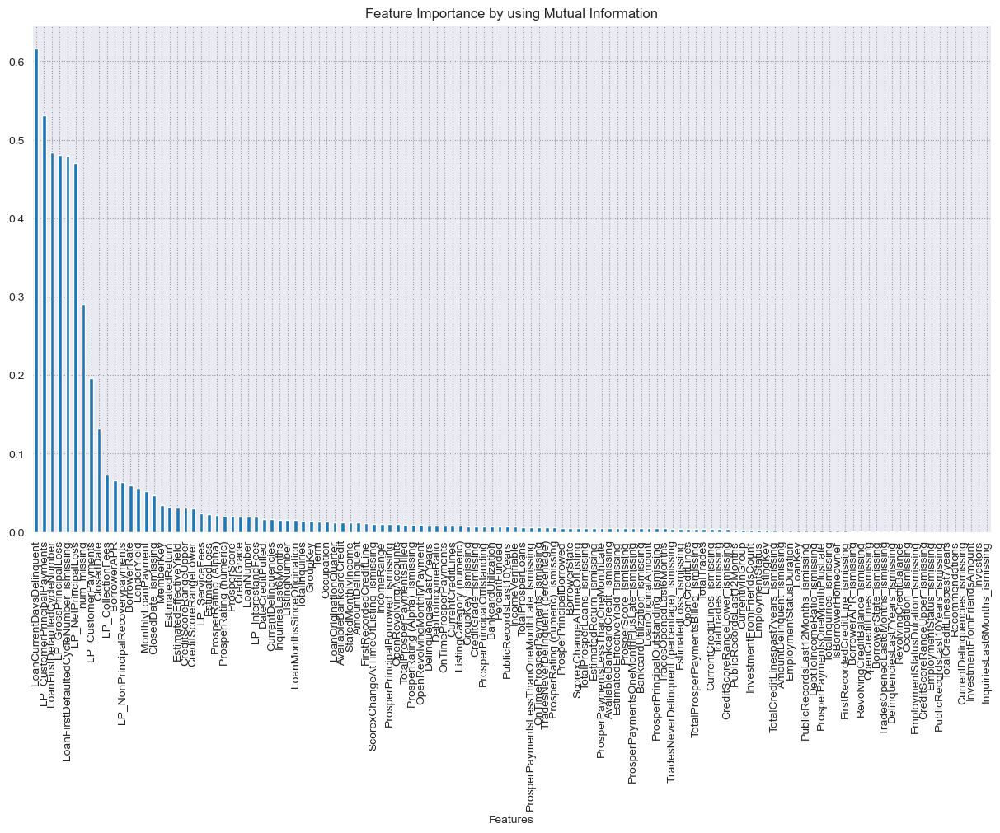

In [77]:
mutual_info.sort_values(ascending=False).plot.bar(figsize=(15, 8))
plt.title("Feature Importance by using Mutual Information")
plt.xlabel("Features")

# 10 best Feature selection using by mutual_info_classif

In [78]:
from sklearn.feature_selection import SelectKBest
sel_five_cols = SelectKBest(mutual_info_classif, k=10)
sel_five_cols.fit(X, y)
selected_data=X.columns[sel_five_cols.get_support()]
selected_data

Index(['ClosedDate', 'LoanFirstDefaultedCycleNumber_ismissing',
       'LoanCurrentDaysDelinquent', 'LoanFirstDefaultedCycleNumber',
       'LP_CustomerPayments', 'LP_CustomerPrincipalPayments',
       'LP_CollectionFees', 'LP_GrossPrincipalLoss', 'LP_NetPrincipalLoss',
       'num_missing'],
      dtype='object')

In [79]:
X=X.loc[:,['ClosedDate', 'BorrowerAPR', 'BorrowerRate',
       'LoanCurrentDaysDelinquent', 'LP_CustomerPayments',
       'LP_CustomerPrincipalPayments', 'LP_CollectionFees',
       'LP_GrossPrincipalLoss', 'LP_NetPrincipalLoss',
       'LP_NonPrincipalRecoverypayments']]

In [80]:
df.corr()

,ListingNumber,Term,LoanStatus,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),...,TotalProsperLoans_ismissing,TotalProsperPaymentsBilled_ismissing,OnTimeProsperPayments_ismissing,ProsperPaymentsLessThanOneMonthLate_ismissing,ProsperPaymentsOneMonthPlusLate_ismissing,ProsperPrincipalBorrowed_ismissing,ProsperPrincipalOutstanding_ismissing,ScorexChangeAtTimeOfListing_ismissing,LoanFirstDefaultedCycleNumber_ismissing,num_missing
ListingNumber,1.000000,0.218632,0.038664,0.282503,0.187988,0.191111,0.195839,-0.020824,-0.097318,-0.017810,...,-0.269539,-0.269539,-0.269539,-0.269539,-0.269539,-0.269539,-0.269539,-0.256917,0.171373,-0.722353
Term,0.218632,1.000000,-0.107486,0.070687,0.117930,0.118964,0.176520,-0.050921,0.313906,0.039194,...,-0.061554,-0.061554,-0.061554,-0.061554,-0.061554,-0.061554,-0.061554,-0.060054,-0.038375,-0.113685
LoanStatus,0.038664,-0.107486,1.000000,-0.240775,-0.264027,-0.260596,-0.294959,-0.206461,-0.214941,0.225422,...,-0.060274,-0.060274,-0.060274,-0.060274,-0.060274,-0.060274,-0.060274,-0.060526,0.906228,-0.026323
BorrowerAPR,0.282503,0.070687,-0.240775,1.000000,0.988500,0.987660,0.788380,0.913957,0.713048,-0.957202,...,-0.056479,-0.056479,-0.056479,-0.056479,-0.056479,-0.056479,-0.056479,-0.057983,-0.206645,-0.207979
BorrowerRate,0.187988,0.117930,-0.264027,0.988500,1.000000,0.998667,0.782371,0.906514,0.747490,-0.943747,...,-0.026328,-0.026328,-0.026328,-0.026328,-0.026328,-0.026328,-0.026328,-0.028502,-0.239217,-0.137716
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ProsperPrincipalBorrowed_ismissing,-0.269539,-0.061554,-0.060274,-0.056479,-0.026328,-0.027668,0.157405,0.055100,0.082191,-0.038891,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.992174,-0.085006,0.651638
ProsperPrincipalOutstanding_ismissing,-0.269539,-0.061554,-0.060274,-0.056479,-0.026328,-0.027668,0.157405,0.055100,0.082191,-0.038891,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.992174,-0.085006,0.651638
ScorexChangeAtTimeOfListing_ismissing,-0.256917,-0.060054,-0.060526,-0.057983,-0.028502,-0.029852,0.153471,0.051052,0.075384,-0.034969,...,0.992174,0.992174,0.992174,0.992174,0.992174,0.992174,0.992174,1.000000,-0.081575,0.647070
LoanFirstDefaultedCycleNumber_ismissing,0.171373,-0.038375,0.906228,-0.206645,-0.239217,-0.235245,-0.253207,-0.210934,-0.223038,0.217872,...,-0.085006,-0.085006,-0.085006,-0.085006,-0.085006,-0.085006,-0.085006,-0.081575,1.000000,-0.073729


<AxesSubplot: >

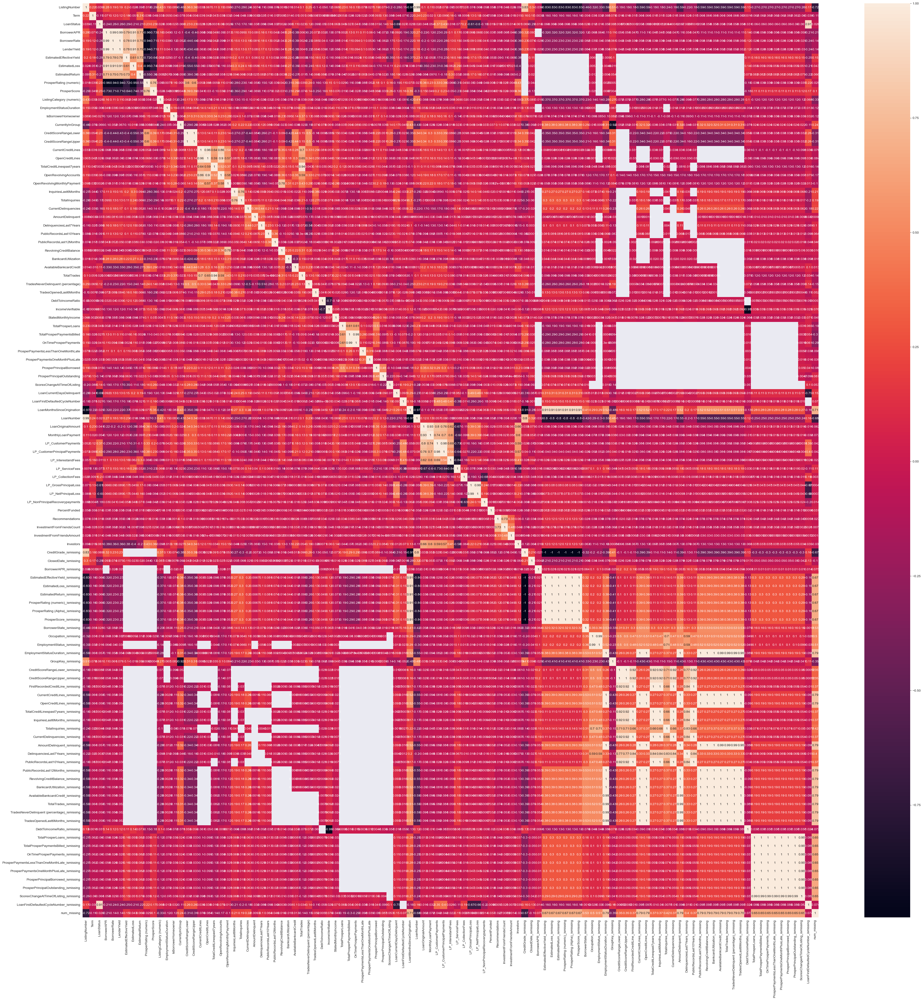

In [81]:
plt.figure(figsize=(50,50))
sns.heatmap(df.corr(),cbar=True,annot=True)     

# Handling imbalanced data

To reduce overfitting and underfitting problem.

Over Sampling minority class using Synthetic Minority Oversampling Technique (SMOTE)-In this method, synthetic samples are generated for the minority class and equal to the majority class.

In [82]:
from imblearn.over_sampling import SMOTE 
smot = SMOTE(sampling_strategy='minority') 
X, y = smot.fit_resample(X, y) 
y.value_counts()

1.0    38074
0.0    38074
Name: LoanStatus, dtype: int64

# Spliting data into training and testing

In [83]:
X_train, X_test, y_train, y_test = train_test_split(X,y,train_size=int(len(X) * 0.67),random_state=42)
print('Total no. of samples: Training and Testing dataset separately!')
print('X_train:', np.shape(X_train))
print('y_train:', np.shape(y_train))
print('X_test:', np.shape(X_test))
print('y_test:', np.shape(y_test))

Total no. of samples: Training and Testing dataset separately!
X_train: (51019, 10)
y_train: (51019,)
X_test: (25129, 10)
y_test: (25129,)


In [84]:
X_train.head()

,ClosedDate,BorrowerAPR,BorrowerRate,LoanCurrentDaysDelinquent,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments
11771,2483,0.22287,0.2005,0.0,4018.64,3000.0,0.0,0.0,0.0,0.0
25799,2438,0.24246,0.2049,0.0,7782.86,7000.0,0.0,0.0,0.0,0.0
39331,999,0.14458,0.1375,0.0,8312.59,7000.0,0.0,0.0,0.0,0.0
6158,1349,0.08778,0.0800,0.0,2391.63,2200.0,0.0,0.0,0.0,0.0
44127,8,0.09688,0.0900,0.0,2551.89,2550.0,0.0,0.0,0.0,0.0


# Standardize the data

In [90]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

# Model Building

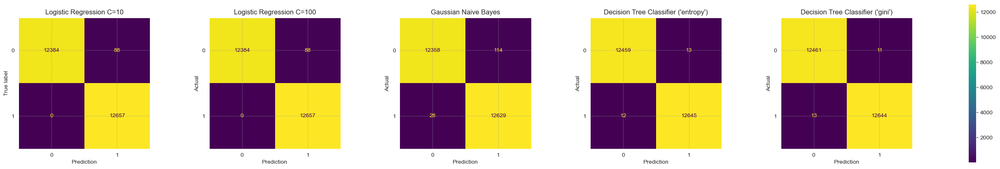

,CV_Score,X_train_Pred_Acc,X_test_Pred_Acc,Roc_Auc_Score,RMSValue
Logistic Regression C=10,0.996315,0.996315,0.996498,0.996472,0.059177
Logistic Regression C=100,0.996354,0.996354,0.996498,0.996472,0.059177
Gaussian Naive Bayes,0.993767,0.993787,0.994349,0.994324,0.075172
Decision Tree Classifier ('entropy'),0.999432,1.000000,0.999005,0.999005,0.031542
Decision Tree Classifier ('gini'),0.999353,1.000000,0.999045,0.999045,0.030904


In [91]:
models = {"Logistic Regression C=10": LogisticRegression(C=10), 
          "Logistic Regression C=100": LogisticRegression(C=100),
          "Gaussian Naive Bayes": GaussianNB(), 
          "Decision Tree Classifier ('entropy')": DecisionTreeClassifier(criterion='entropy'),
          "Decision Tree Classifier ('gini')": DecisionTreeClassifier(criterion='gini'),
          }

res = {}
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
f, axes = plt.subplots(1, 5, figsize=(35, 5))

for i, (name, model) in enumerate(models.items()):
    
    n = name + " " 
    clf = model.fit(X_train,y_train)
    y_pred_tr = model.predict(X_train)
    y_pred_ts = model.predict(X_test)
        

    Cross_Validation_Score = cross_val_score(clf, X_train, y_train, cv=10).mean()
        
    acc_pred_tr = np.mean(accuracy_score(y_train,y_pred_tr))
    acc_pred_ts = np.mean(accuracy_score(y_test,y_pred_ts))
        
    RMSValue = np.sqrt(mean_squared_error(y_test, y_pred_ts))
       
    Roc_Auc_Score =  roc_auc_score(y_test, y_pred_ts)
        
    res[n] = {"CV_Score": Cross_Validation_Score ,
                  "X_train_Pred_Acc":acc_pred_tr,"X_test_Pred_Acc":acc_pred_ts,
                  "RMSValue":RMSValue,"Roc_Auc_Score":Roc_Auc_Score 
                   }
        


    cf_matrix = confusion_matrix(y_test, y_pred_ts)
    disp = ConfusionMatrixDisplay(cf_matrix)
   
    disp.plot(ax=axes[i])
    disp.ax_.set_title(name)
    disp.im_.colorbar.remove()
    disp.ax_.set_xlabel('Prediction')
  
    if i!=0:
        disp.ax_.set_ylabel('Actual')
    
plt.subplots_adjust(wspace=0.45, hspace=0.1)
f.colorbar(disp.im_, ax=axes)
plt.show()

results = pd.DataFrame.from_dict(res, orient="index")
results = results[["CV_Score",'X_train_Pred_Acc','X_test_Pred_Acc','Roc_Auc_Score',"RMSValue"]]

results

# Predictiong the ROI

In [92]:
import lightgbm
X1 = data.copy()
y1 = X1.pop("BorrowerRate")
gbm = lightgbm.LGBMRegressor()
gbm.fit(X1, y1)

LGBMRegressor()

In [93]:
gbm.booster_.feature_importance()
fea_imp_ = pd.DataFrame({'cols':X1.columns, 'fea_imp':gbm.feature_importances_})
fea_imp_sorted = fea_imp_.loc[fea_imp_.fea_imp > 0].sort_values(by=['fea_imp'], ascending = True)
fea_imp_sorted

,cols,fea_imp
51,TotalProsperLoans_ismissing,1
40,AmountDelinquent_ismissing,1
41,DelinquenciesLast7Years_ismissing,1
17,CreditGrade_ismissing,1
46,AvailableBankcardCredit_ismissing,1
...,...,...
105,LoanNumber,136
60,ListingNumber,172
9,GroupKey,207
63,BorrowerAPR,583


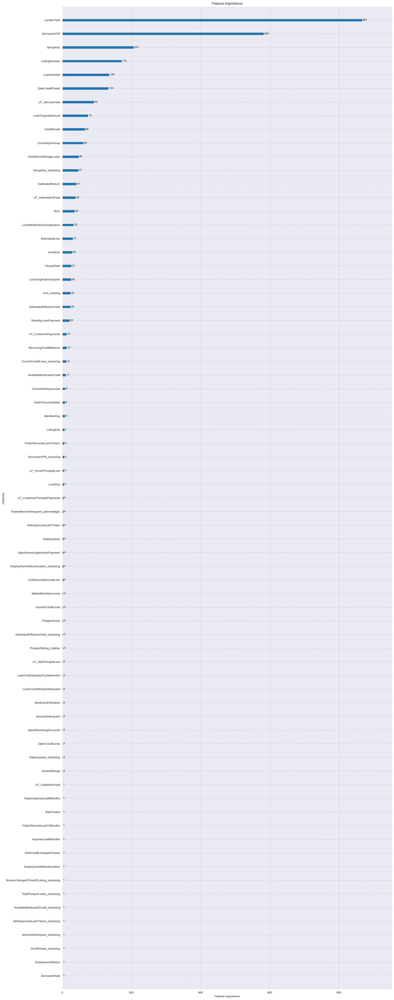

In [94]:
lightgbm.plot_importance(gbm, figsize = (20, 60))
plt.show()

In [95]:
L=fea_imp_sorted.cols.tolist()[-10:]
X1=X1.loc[:,L]

In [96]:
X_train, X_test, y_train, y_test = train_test_split(X1,y1,train_size=int(len(X) * 0.67),random_state=42)
print('Total no. of samples: Training and Testing dataset separately!')
print('X_train:', np.shape(X_train))
print('y_train:', np.shape(y_train))
print('X_test:', np.shape(X_test))
print('y_test:', np.shape(y_test))

Total no. of samples: Training and Testing dataset separately!
X_train: (51019, 10)
y_train: (51019,)
X_test: (6342, 10)
y_test: (6342,)


In [97]:
from xgboost import XGBRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

In [98]:
models = {"XGBRegressor": XGBRegressor(),
    "RandomForestRegressor": RandomForestRegressor(),
    "DecisionTreeRegressor": DecisionTreeRegressor(),
          "LinearRegression":LinearRegression()
          }

res = {}
with warnings.catch_warnings():
    warnings.simplefilter("ignore")

for i, (name, model) in enumerate(models.items()):
    
    n = name + " " 
    
    clf = model.fit(X_train,y_train)
      
    y_pred_tr = model.predict(X_train)
    y_pred_ts = model.predict(X_test)
        
    Cross_Validation_Score = cross_val_score(clf, X_train, y_train, cv=10).mean()

    RMSValue = np.sqrt(mean_squared_error(y_test, y_pred_ts))
      
    res[n] = {"CV_Score": Cross_Validation_Score ,
                  "RMSValue":RMSValue
                   }
results = pd.DataFrame.from_dict(res, orient="index")
results = results[["CV_Score","RMSValue"]]

results

,CV_Score,RMSValue
XGBRegressor,0.999803,0.001263
RandomForestRegressor,0.999774,0.001331
DecisionTreeRegressor,0.999610,0.001613
LinearRegression,0.998115,0.003574


**Since XG Boosting is giving the highest Accuracy so, selecting XG Boost as Final Model**

# Save the Model For Deployment

In [99]:
XG_model = XGBRegressor()

In [100]:
XG_model.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', learning_rate=0.300000012, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=6, max_leaves=0, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, ...)

In [101]:
y_pred = XG_model.predict(X_test)

In [102]:
import pickle 
pickle_out = open("XG_model.pkl", mode = "wb") 
pickle.dump(model, pickle_out) 
pickle_out.close()